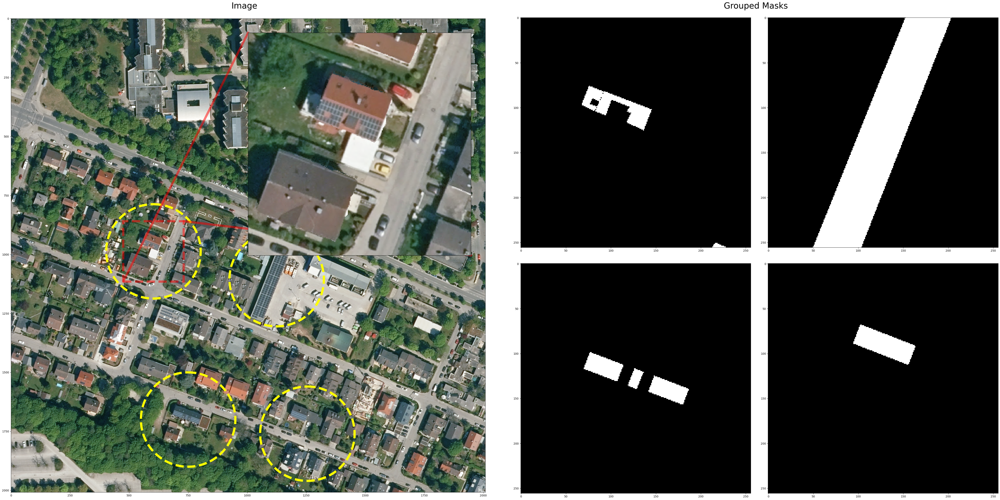

In [24]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import matplotlib.transforms as mtransforms
from matplotlib import cm
from matplotlib import cbook
def do_plot(ax, Z, transform):
    im = ax.imshow(Z, interpolation='none',
                   origin='lower',
                   extent=[-2, 4, -3, 2], clip_on=True)

    trans_data = transform + ax.transData
    im.set_transform(trans_data)

    # display intended extent of the image
    x1, x2, y1, y2 = im.get_extent()
    ax.plot([x1, x2, x2, x1, x1], [y1, y1, y2, y2, y1], "y--",
            transform=trans_data)
    ax.set_xlim(-5, 5)
    ax.set_ylim(-4, 4)


tif = plt.imread('/home/kandelaki/git/SAM-Adapter-PyTorch/figures/geopatchify/tile_SO00303_4018_0.tif')

img1 = plt.imread('/home/kandelaki/git/SAM-Adapter-PyTorch/figures/geopatchify/images/tile_SO00303_4018_0_7.png')
img2 = plt.imread('/home/kandelaki/git/SAM-Adapter-PyTorch/figures/geopatchify/images/tile_SO00303_4018_0_8.png')


mask1 = plt.imread('/home/kandelaki/git/SAM-Adapter-PyTorch/figures/geopatchify/masks/tile_SO00303_4018_0_1.png')
mask4 = plt.imread('/home/kandelaki/git/SAM-Adapter-PyTorch/figures/geopatchify/masks/tile_SO00303_4018_0_9.png')
mask3 = plt.imread('/home/kandelaki/git/SAM-Adapter-PyTorch/figures/geopatchify/masks/tile_SO00303_4018_0_11.png')
mask2 = plt.imread('/home/kandelaki/git/SAM-Adapter-PyTorch/figures/geopatchify/masks/tile_SO00303_4018_0_7.png')
fig = plt.figure(layout="constrained", figsize=(50,25))

subfigs = fig.subfigures(1, 2, wspace=0.05, width_ratios=[1, 1])

img_ax = subfigs[0].subplots()

masks_ax = subfigs[1].subplots(2,2)

subfigs[0].suptitle('Image', fontsize=30)
subfigs[1].suptitle('Grouped Masks', fontsize=30)

# extent = 0, tif.shape[0], 0, tif.shape[1]

img_ax.imshow(tif, origin='upper')

# add circle patch
radius = 200
img_ax.add_patch(
    patches.Circle(
        (475+256//2, 1115-256//2), radius,
        edgecolor="yellow", facecolor="none", linewidth=8, linestyle='--'
    )
)

img_ax.add_patch(
    patches.Circle(
        (475+650, 1115-20//2), radius,
        edgecolor="yellow", facecolor="none", linewidth=8, linestyle='--'
    )
)

img_ax.add_patch(
    patches.Circle(
        (475+275, 1700), radius,
        edgecolor="yellow", facecolor="none", linewidth=8, linestyle='--'
    )
)

img_ax.add_patch(
    patches.Circle(
        (475+780, 1760), radius,
        edgecolor="yellow", facecolor="none", linewidth=8, linestyle='--'
    )
)
x1 = 475
y1 = 1115

# inset axes
x1, x2, y1, y2 = x1, x1+256, y1, y1-256
axins = axins = img_ax.inset_axes(
    [0.5, 0.5, 0.47, 0.47],
    xlim=(x1, x2), ylim=(y1, y2), xticklabels=[], yticklabels=[])

axins.imshow(tif, origin='upper')

rect, connectors = img_ax.indicate_inset_zoom(axins, edgecolor="red", linewidth=8, linestyle='--')

# make connectors thicker
for connector in connectors:
    connector.set_linewidth(8)

masks_ax[0,0].imshow(mask1, cmap=cm.gray)
masks_ax[0,1].imshow(mask2, cmap=cm.gray)
masks_ax[1,0].imshow(mask3, cmap=cm.gray)
masks_ax[1,1].imshow(mask4, cmap=cm.gray)

# plt.show()
plt.savefig('test.png', dpi=300)



TransformedBbox(
    Bbox(x0=0.125, y0=0.10999999999999999, x1=0.9, y1=0.88),
    BboxTransformTo(
        TransformedBbox(
            Bbox(x0=0.0, y0=0.0, x1=6.4, y1=4.8),
            Affine2D().scale(100.0))))


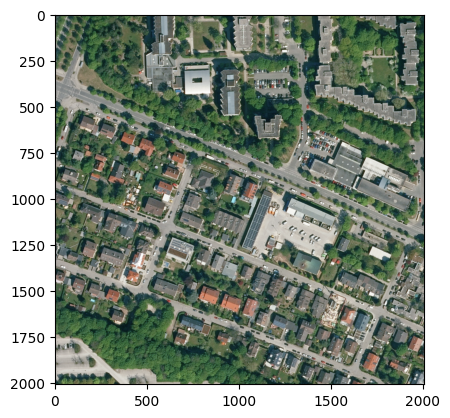

In [21]:
import matplotlib.pyplot as plt
tif = plt.imread('/home/kandelaki/git/SAM-Adapter-PyTorch/figures/geopatchify/tile_SO00303_4018_0.tif')

fig, ax = plt.subplots()
ax.imshow(tif)
print(ax.get_window_extent())